In [ ]:
from SAES.latex_generation.stats_table import Friedman
from SAES.latex_generation.stats_table import Wilcoxon
from SAES.plots.boxplot import Boxplot
from SAES.plots.CDplot import CDplot
from SAES.multiobjective.pareto_front import Front2D
from SAES.multiobjective.pareto_front import Front3D
from SAES.multiobjective.pareto_front import FrontND

import pandas as pd

In [2]:
"""
In order to generate the HTML code from the notebook, write this command in the terminal:
jupyter nbconvert --to html --no-input multiobjective_optimization.ipynb

If you do not have jupyter installed, you can use the python terminal:
python -m nbconvert --to html --no-input multiobjective_optimization.ipynb
""";

In [ ]:
# Load the experiment data
fronts_path = "fronts"
references_path = "references"
experiment_data = pd.read_csv(f'{fronts_path}/QualityIndicatorSummary.csv')
metrics = pd.read_csv(f'{fronts_path}/multiobjectiveMetrics.csv')

# Comparative study of multi-objective metaheuristics (MOEA/D variants)
The study contained in this booklet is a performance comparison of different variants of the MOEA/D algorithm solving the DTLZ benchmark. Selecting the IGD+ quality indicator, we include, firstly, statistical information and, secondly, we show, for each problem, the boxplots and fronts corresponding to the median IGD+ values of each of the algorithms. 

## IGD+ quality indicator

In [4]:
metric = "IGD+"

In [5]:
friedman = Friedman(experiment_data, metrics, metric)
friedman.show()

,MOEAD,MOEAD4,MOEAD1,MOEAD2,MOEAD3,Friedman
DTLZ1,3.0171e-02,2.9051e-02,3.0781e-02,2.8517e-02,2.8510e-02,+
DTLZ2,2.2219e-02,2.2739e-02,2.7558e-02,2.2834e-02,2.2675e-02,+
DTLZ3,4.8494e-02,6.9652e-02,3.2550e-02,2.5217e-02,2.4148e-02,+
DTLZ4,1.2537e-02,2.2105e-02,2.4115e-02,2.2968e-02,2.5051e-02,=
DTLZ5,1.2952e-02,2.5617e-03,2.3023e-03,2.5477e-03,2.4710e-03,+
DTLZ6,7.2227e-02,2.4283e-03,2.1646e-03,2.4016e-03,2.4078e-03,+
DTLZ7,5.6334e-02,2.0729e-02,2.7976e-02,2.0933e-02,2.0902e-02,+


## Wilcoxon rank-sum test table

In [6]:
wilcoxon = Wilcoxon(experiment_data, metrics, metric)
wilcoxon.show()

,MOEAD4,MOEAD1,MOEAD2,MOEAD3
MOEAD,=+=+---,=+-+---,-+-+---,-+-+---
MOEAD4,,++-=--+,-=-====,-=-=-=+
MOEAD1,,,---=++-,---=++-
MOEAD2,,,,==-=-==


## Critical distance ranking

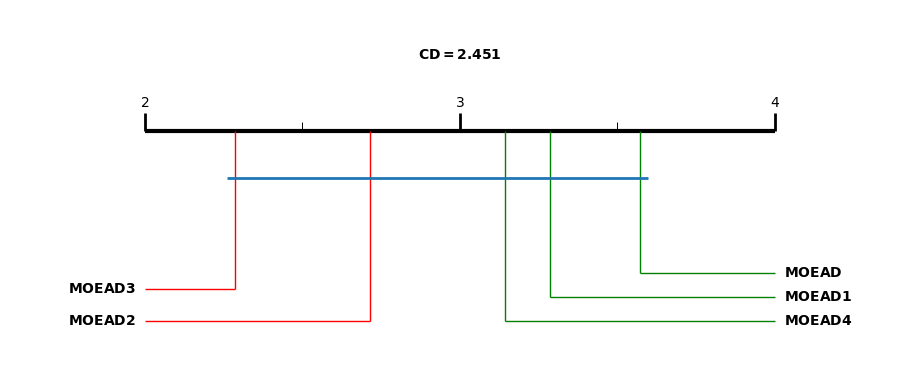

In [7]:
cdplot = CDplot(experiment_data, metrics, metric)
cdplot.show()

# SAES `Fronts` class
The `Saes` library provides a class named `Fronts` that provides methods to visualize Pareto front approximations of multi-objective experimental studies. To use this class, the files containing the fronts must be organized in a particular folder structured that is inherited from the one generated by the [experimental studies conducted with the jMetal framework](https://jmetal.readthedocs.io/en/latest/experimentation.html).

## Configuring Algorithm Fronts
Each algorithm's front data should be organized in the following folder structure:

```
📂 fronts_folder  
├── 📂 algorithm-1/            
│   ├── 📂 instance-1  
|   |    ├── BEST_metric-1_FUN.csv
|   |    ├── MEDIAN_metric-1_FUN.csv
|   |    .
|   |    .
|   |    ├── BEST_metric-k_FUN.csv
|   |    ├── MEDIAN_metric-k_FUN.csv
│   ├── 📂 instance-2
|   .
|   .
|   └── 📂 instance-m
├── 📂 algorithm-2/             
.
.
├── 📂 algorithm-n/               
```

- Each **algorithm** has its own directory inside `fronts_folder`.  
- Within each algorithm’s folder, **instances** are stored as subdirectories.  
- Each instance contains multiple CSV files representing Pareto fronts, following the format:  
  - `BEST_metric-x_FUN.csv`: The best Pareto front based on metric `x`.  
  - `MEDIAN_metric-x_FUN.csv`: The median Pareto front based on metric `x`.

## Configuring Reference Fronts  

The reference front data should be stored in a separate folder with the following structure: 

```
📂 references_folder  
├── instance-1.csv
├── instance-2.csv          
.
.
├── instance-m.csv          
```

- Each **instance** has a corresponding reference front file.  

By correctly setting up these data sources, you can ensure accurate Pareto front visualizations using the `Saes` multiobjective module.

The `Fronts` class provides methods to plot fronts of solutions using 2D, 3D and parallel coordenate plots. This functionaly is illustrated in the cells below, where the fronts obtained by variants of MOEA/D for the DTLZ benchmark (composed by default of problems with three objectives) are shown.

## Boxplot + Pareto Fronts for each problem (2D projection of the first two objectives)

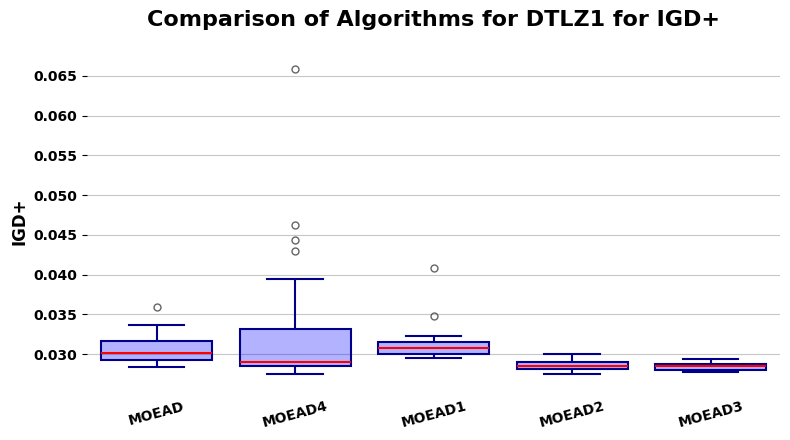

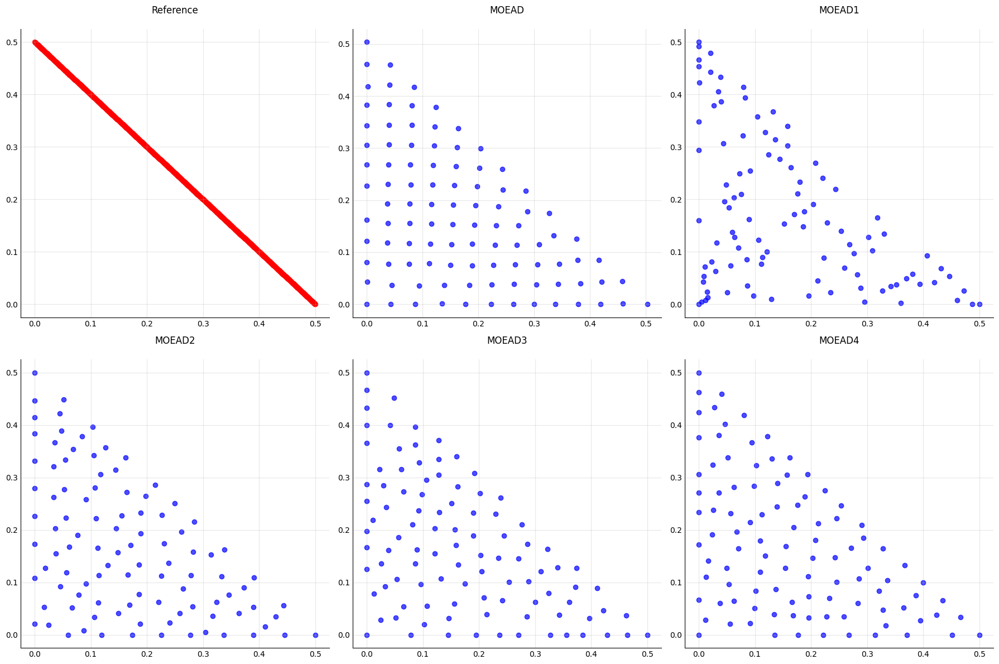

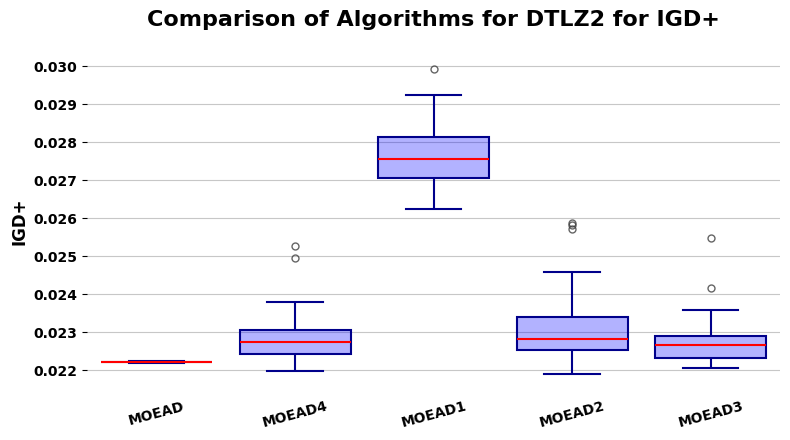

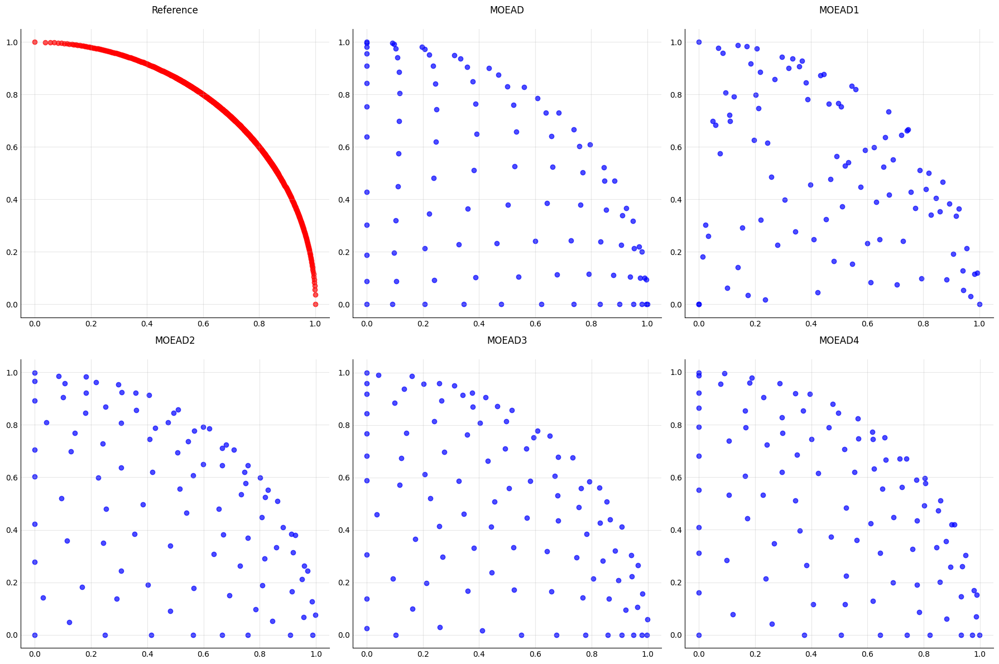

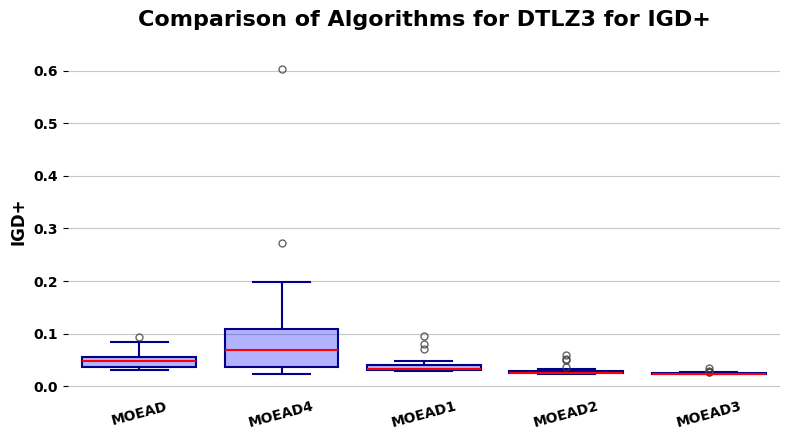

...

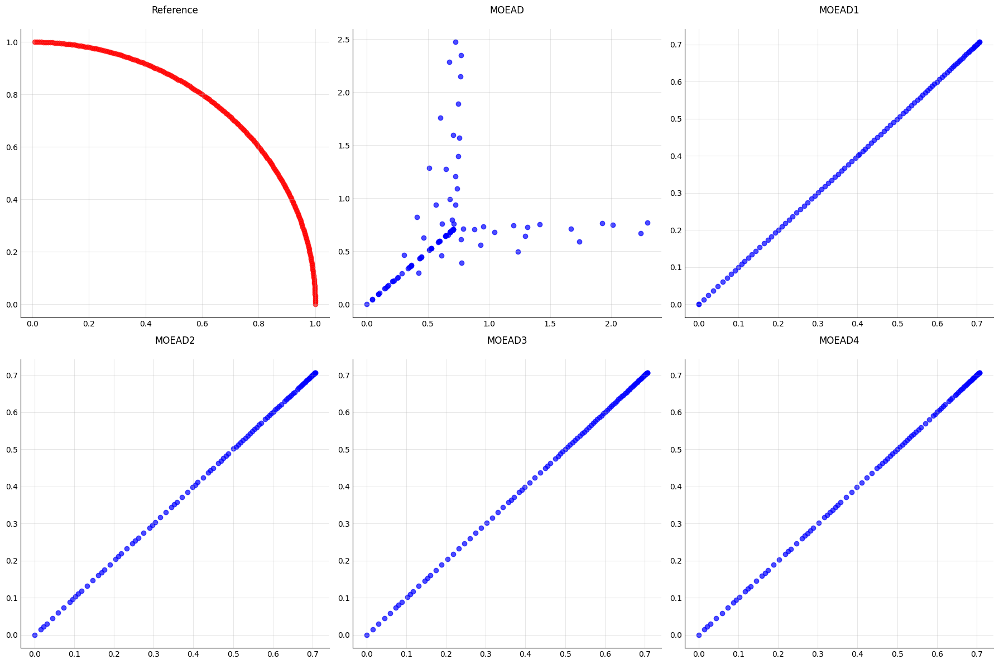

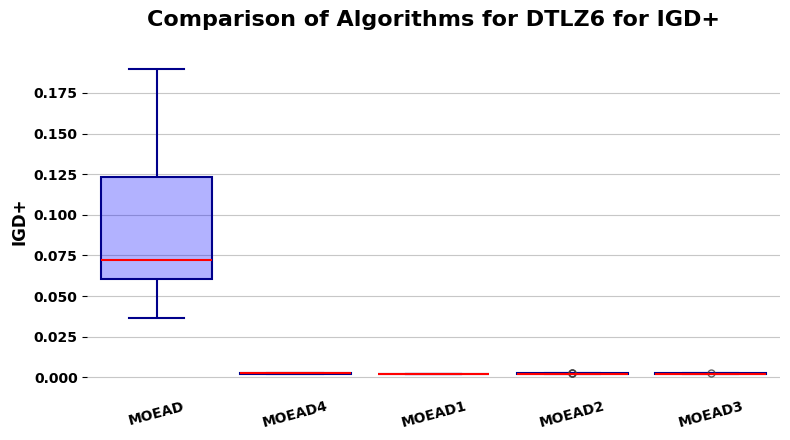

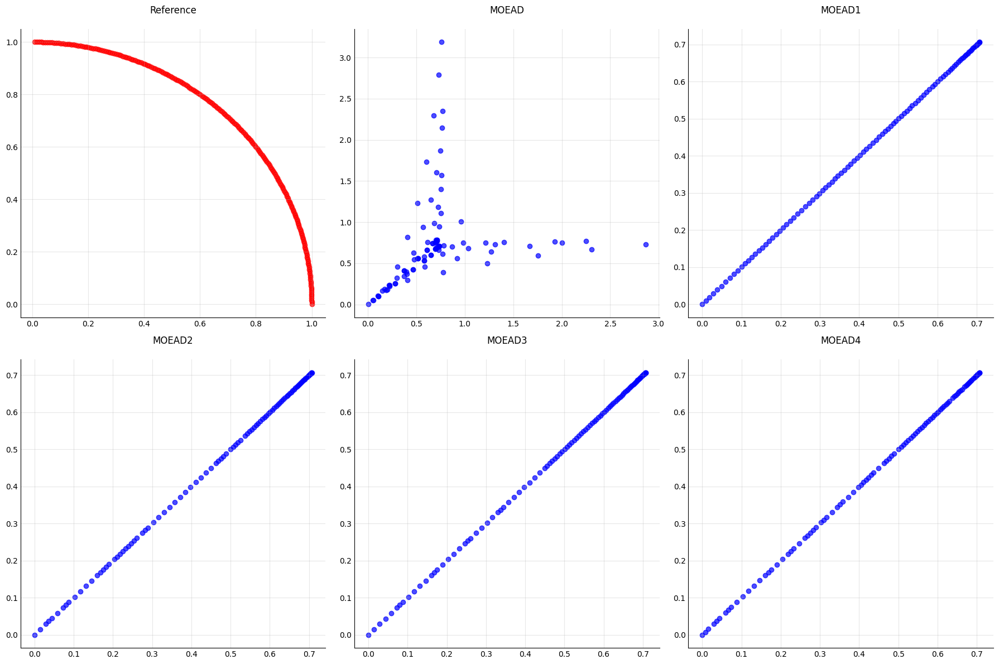

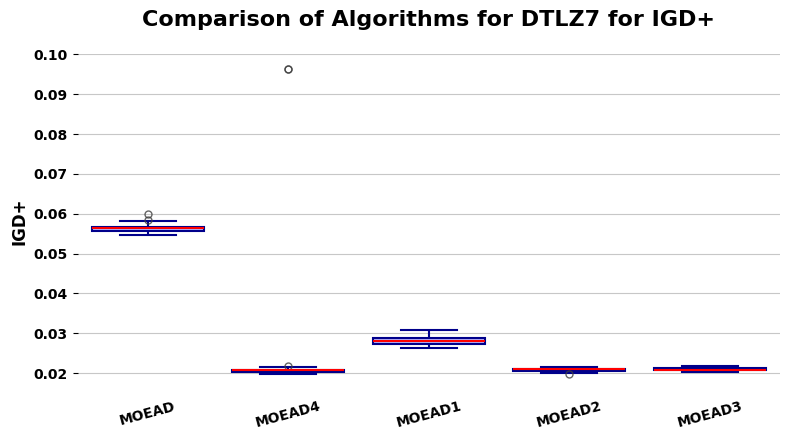

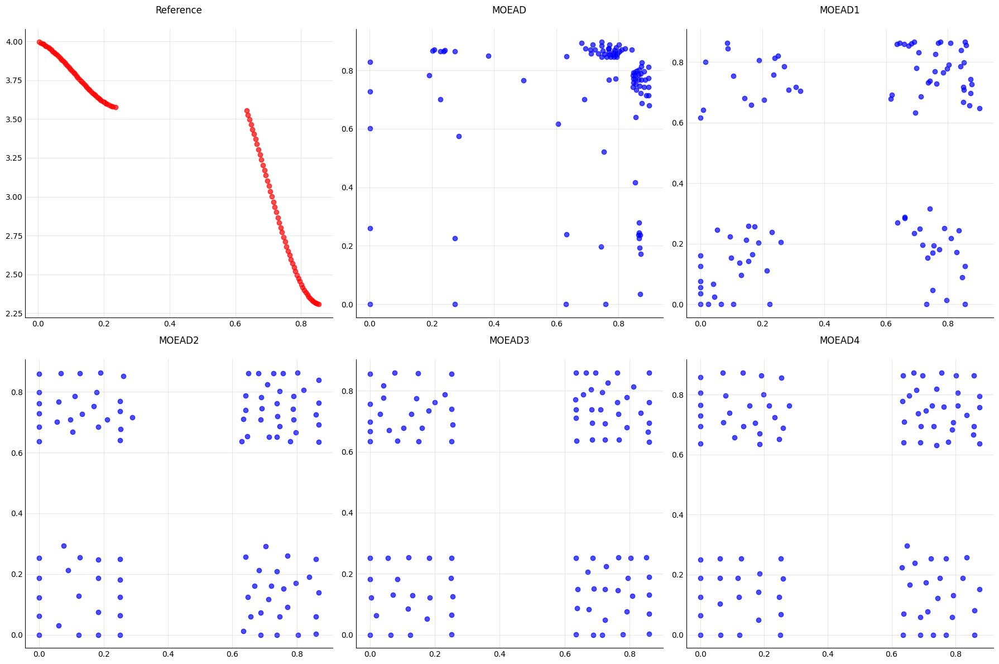

In [8]:
front = Front2D(fronts_path, references_path, metric)
boxplot = Boxplot(experiment_data, metrics, metric)

for instance in front.instances:
    boxplot.show_instance(instance)
    front.show(instance, median=True)
    print("\n"*6)

## Boxplot + Pareto Fronts for each problem (3D)

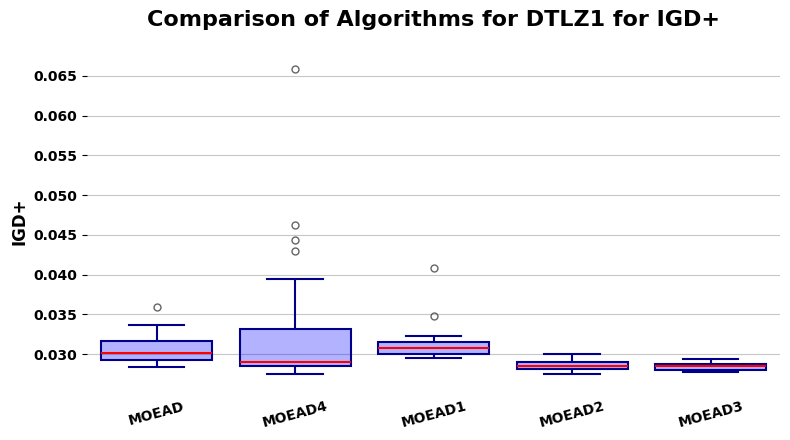

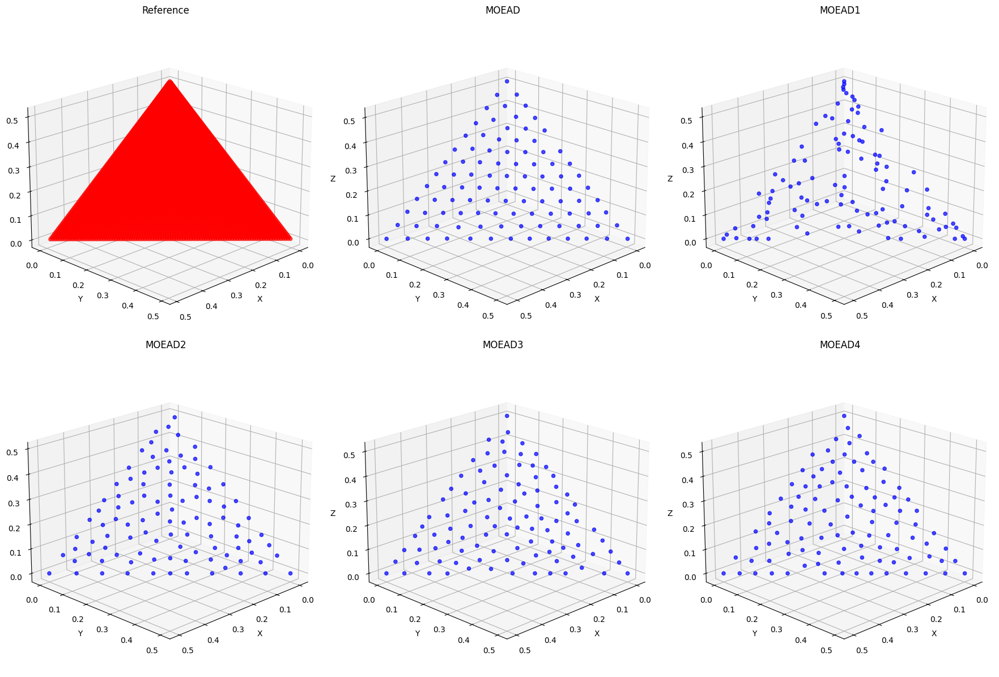

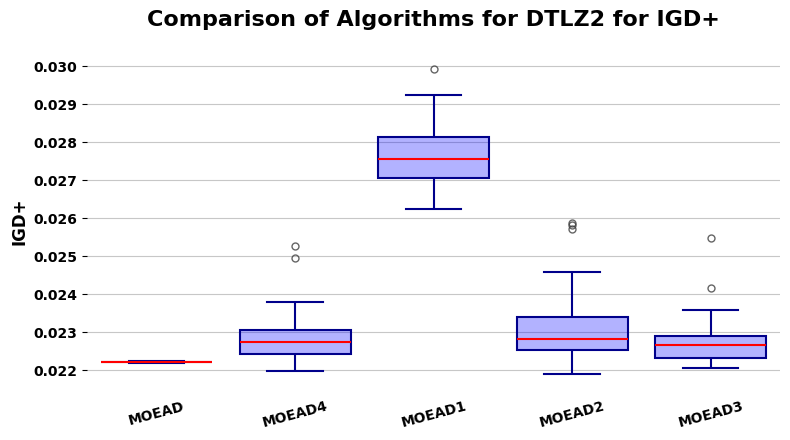

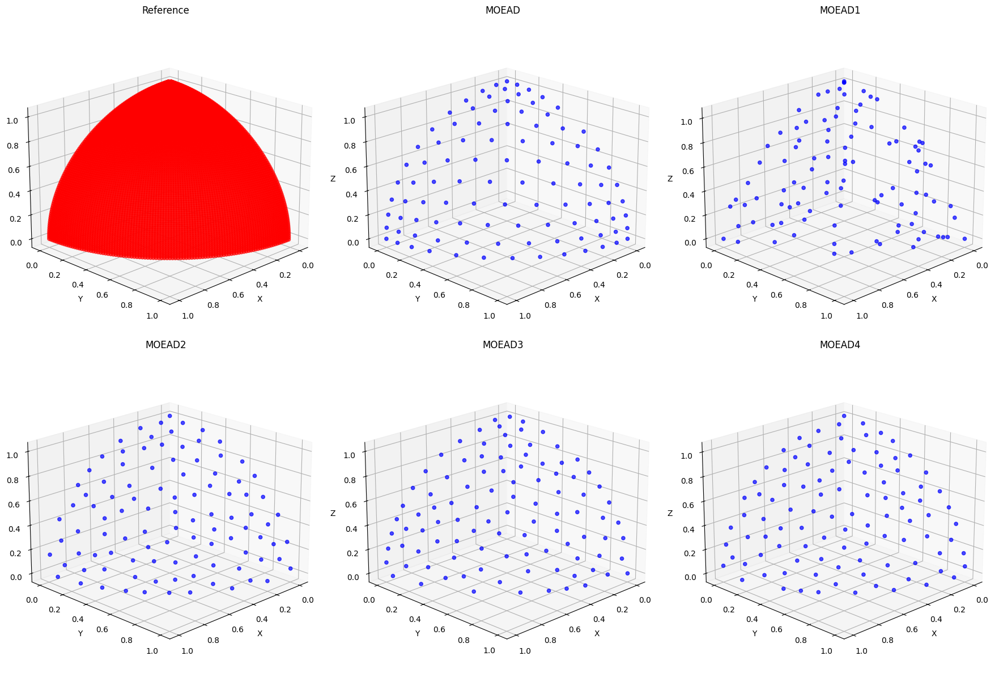

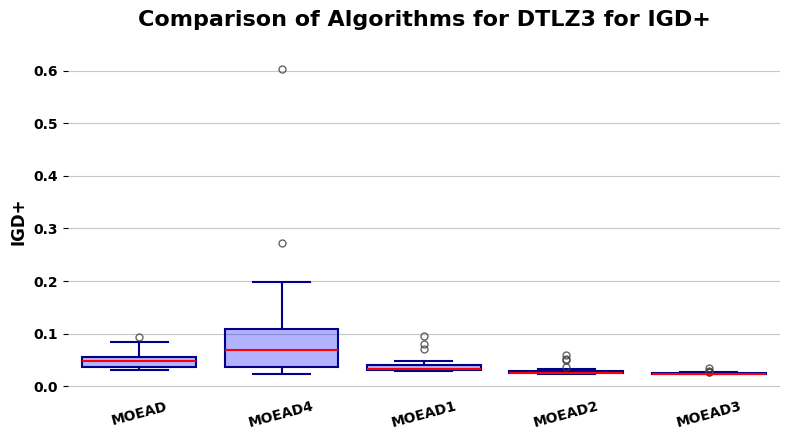

...

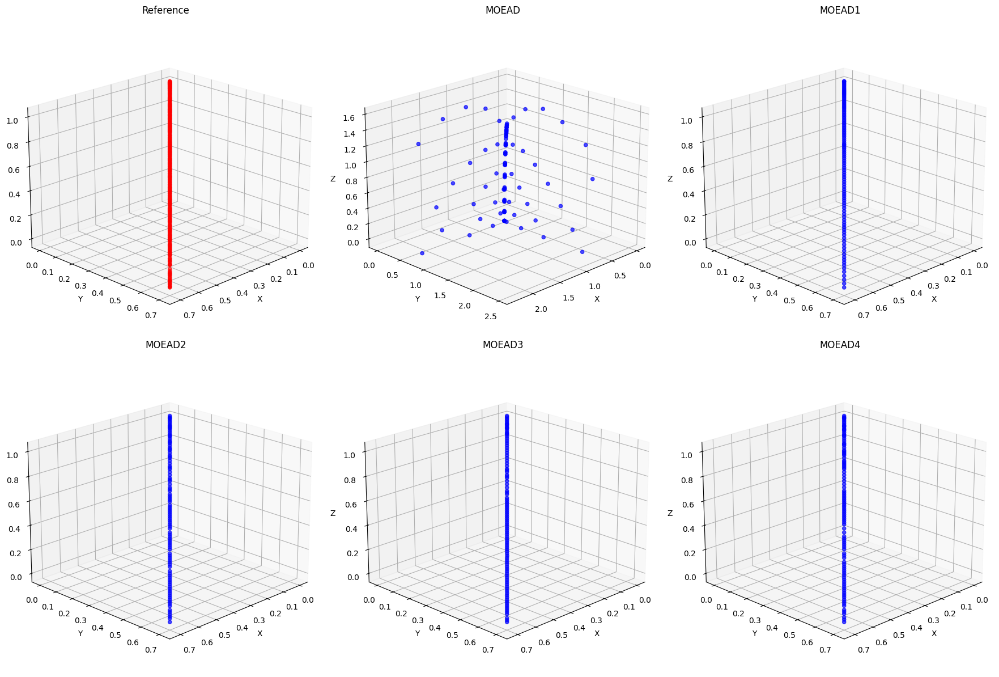

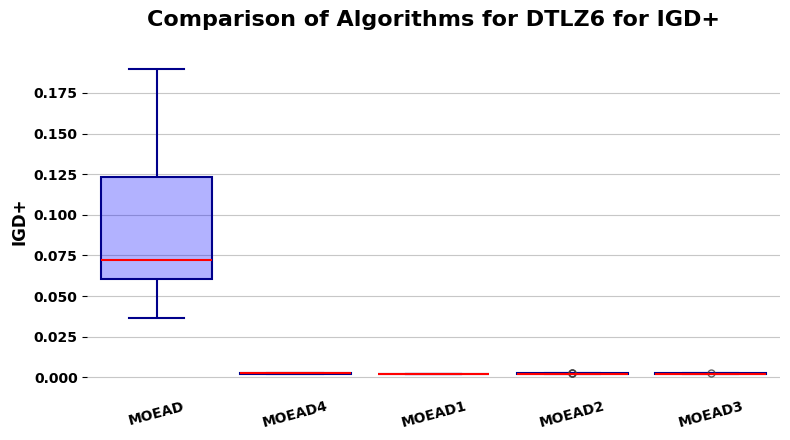

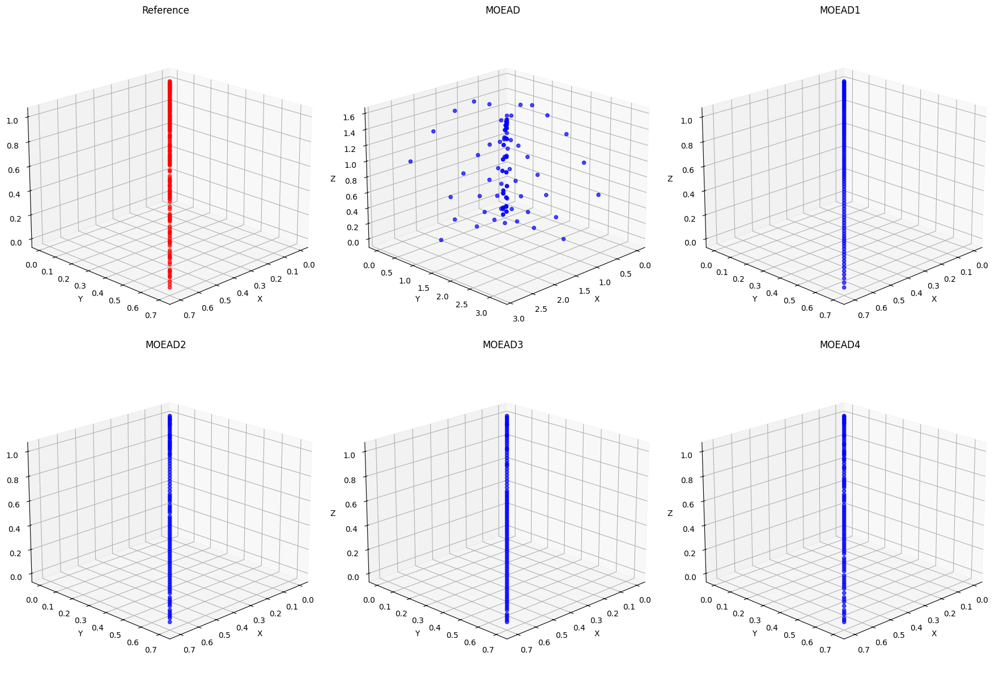

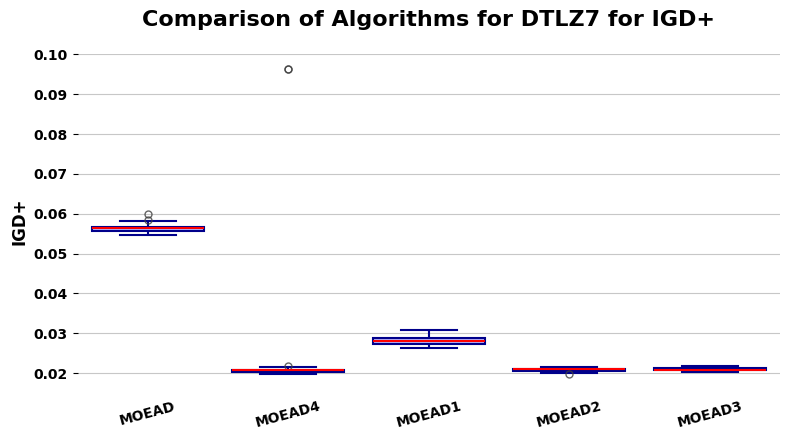

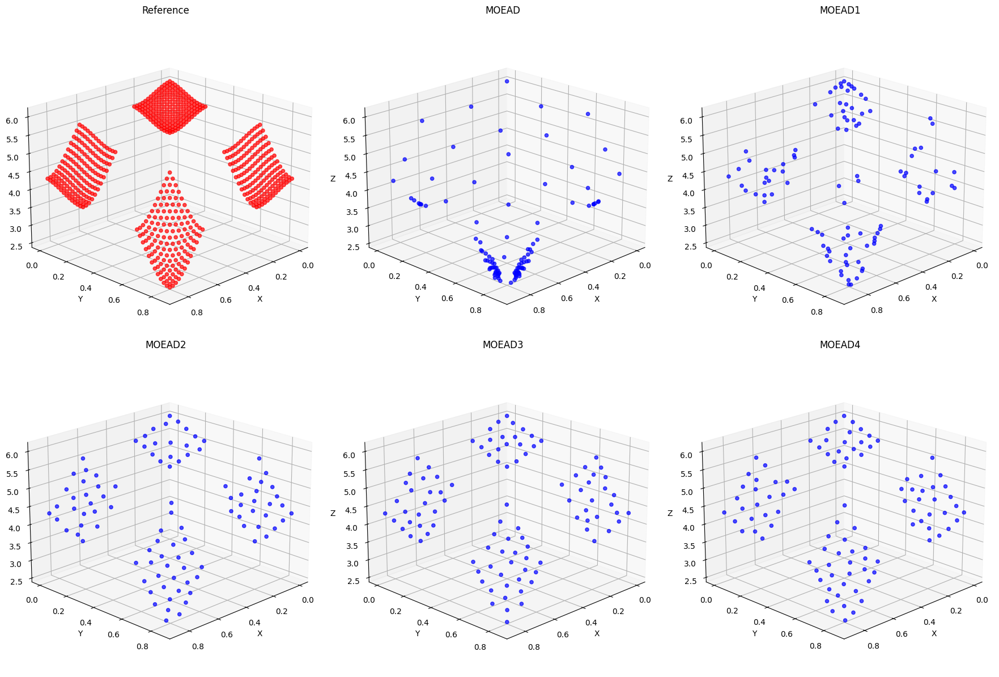

In [9]:
front = Front3D(fronts_path, references_path, metric)
boxplot = Boxplot(experiment_data, metrics, metric)

for instance in front.instances:
    boxplot.show_instance(instance)
    front.show(instance, median=True)
    print("\n"*6)

## Boxplot + Parallel Coordinates Graph (ND)

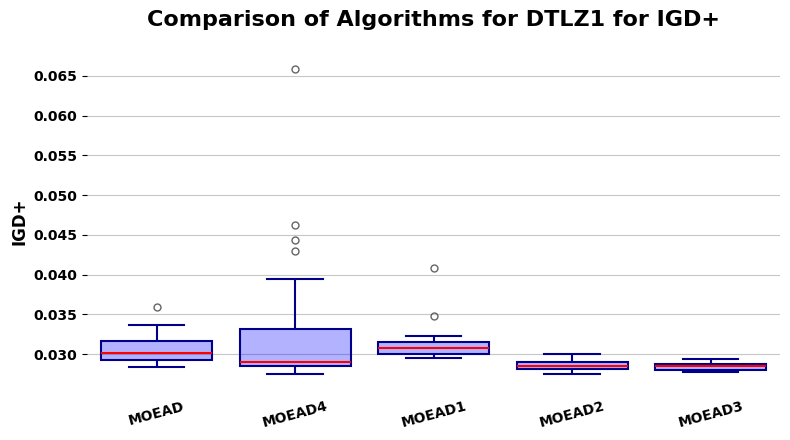

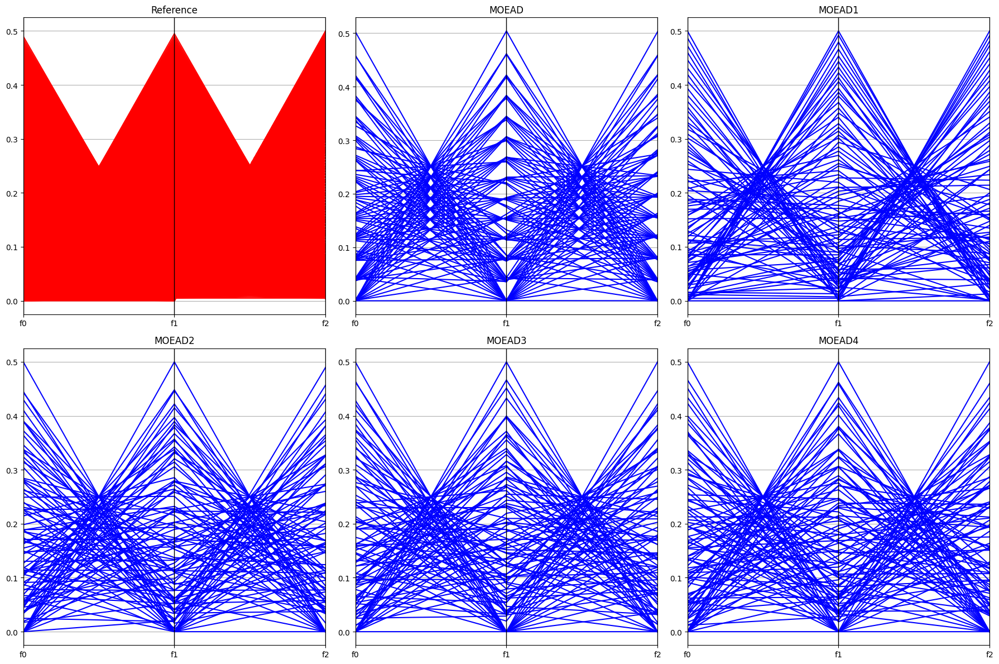

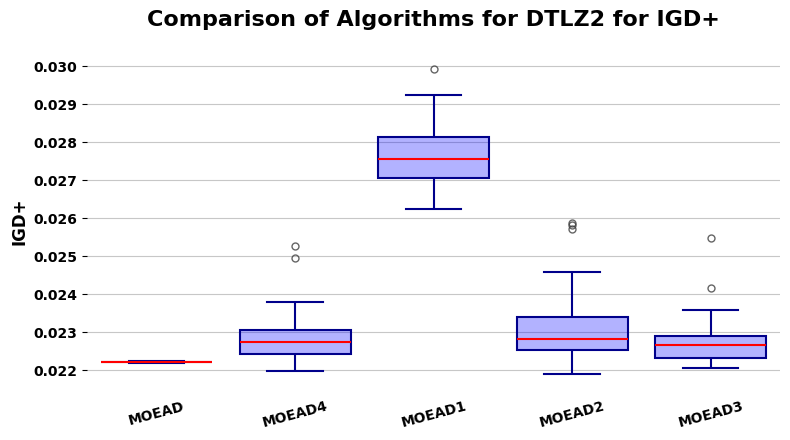

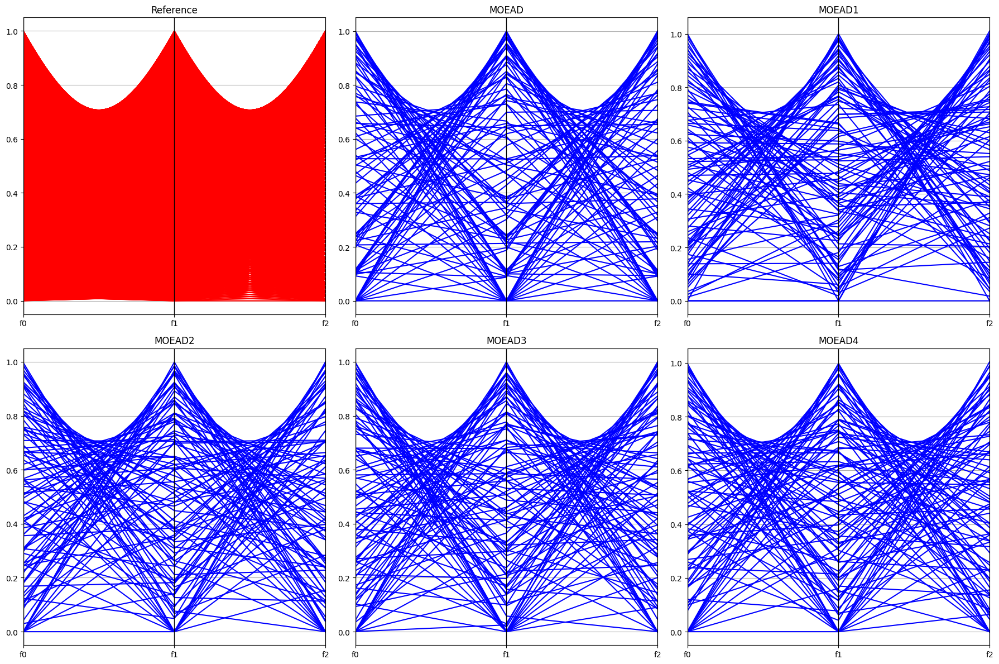

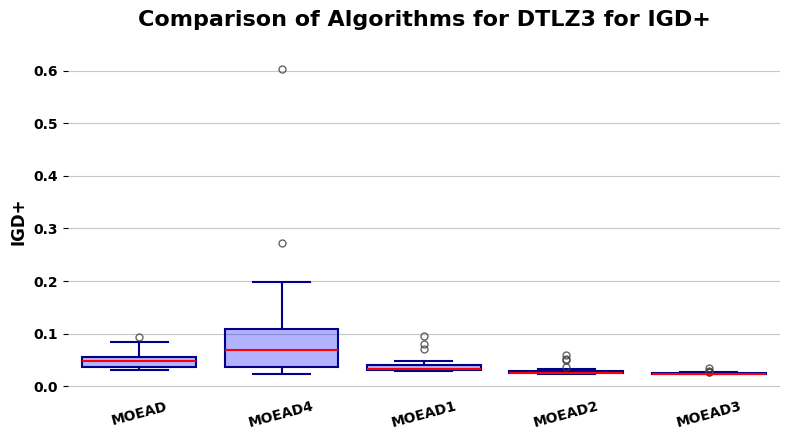

...

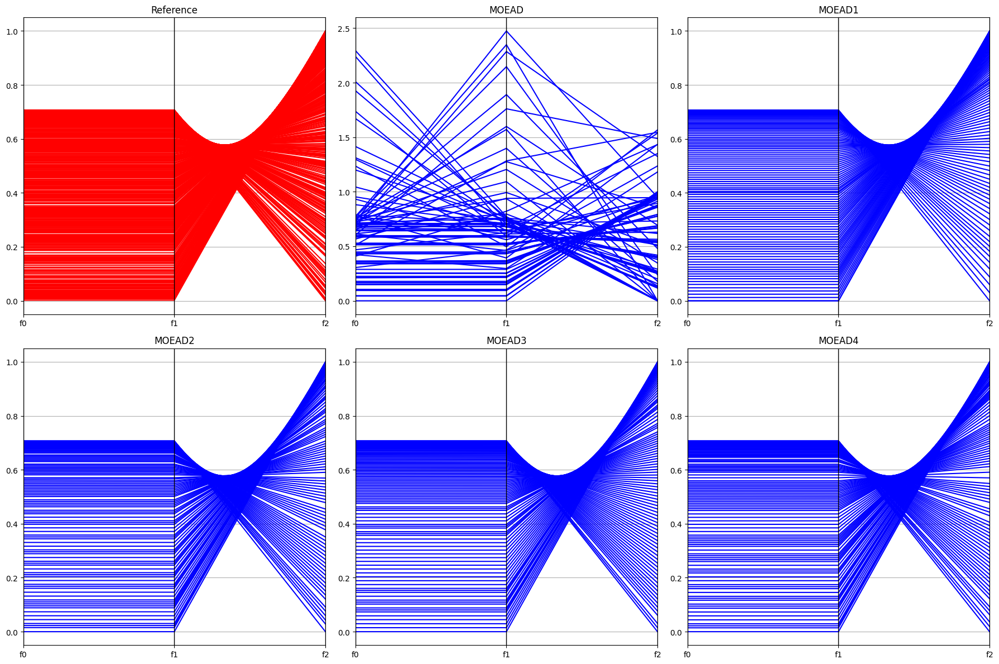

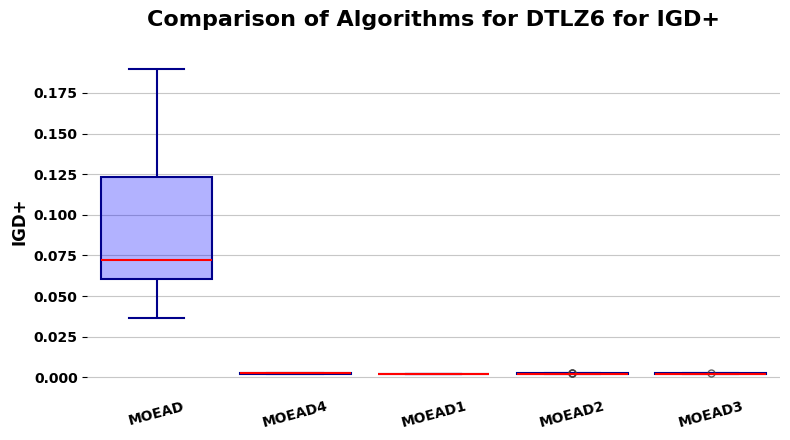

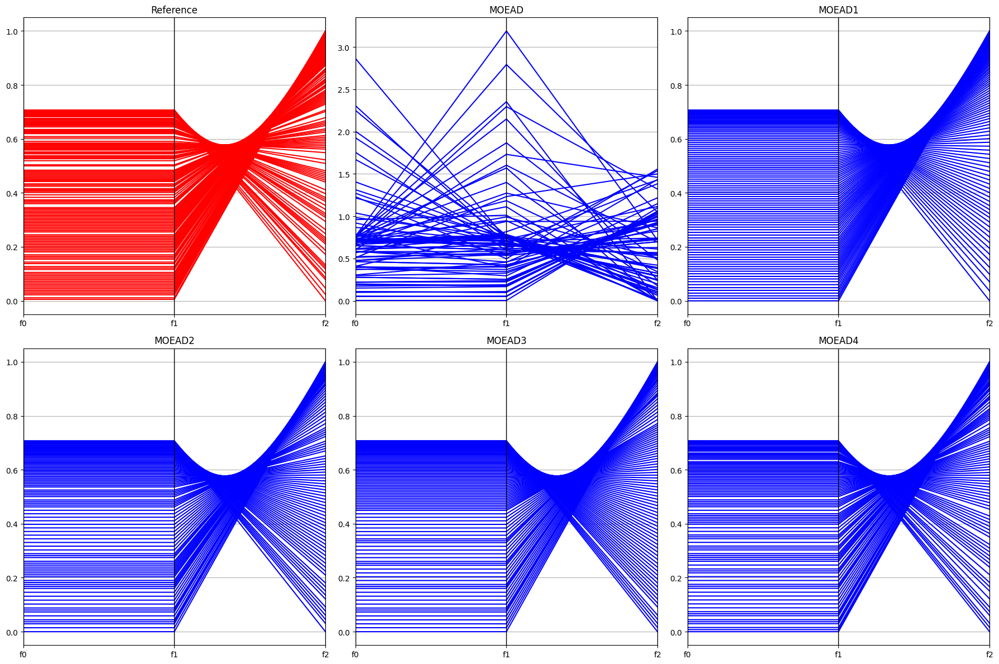

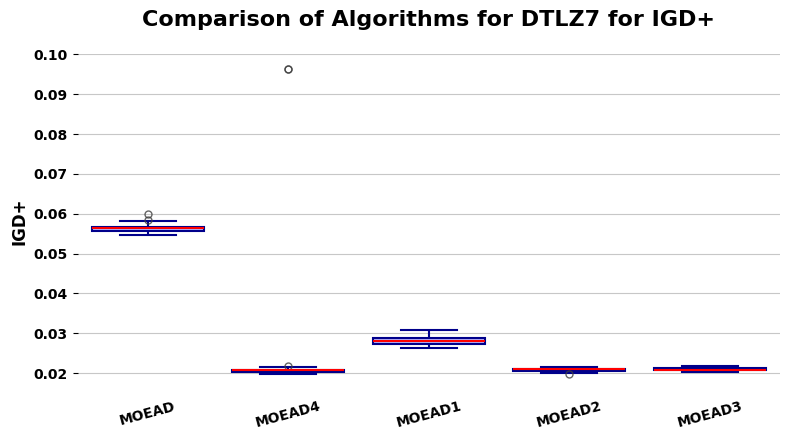

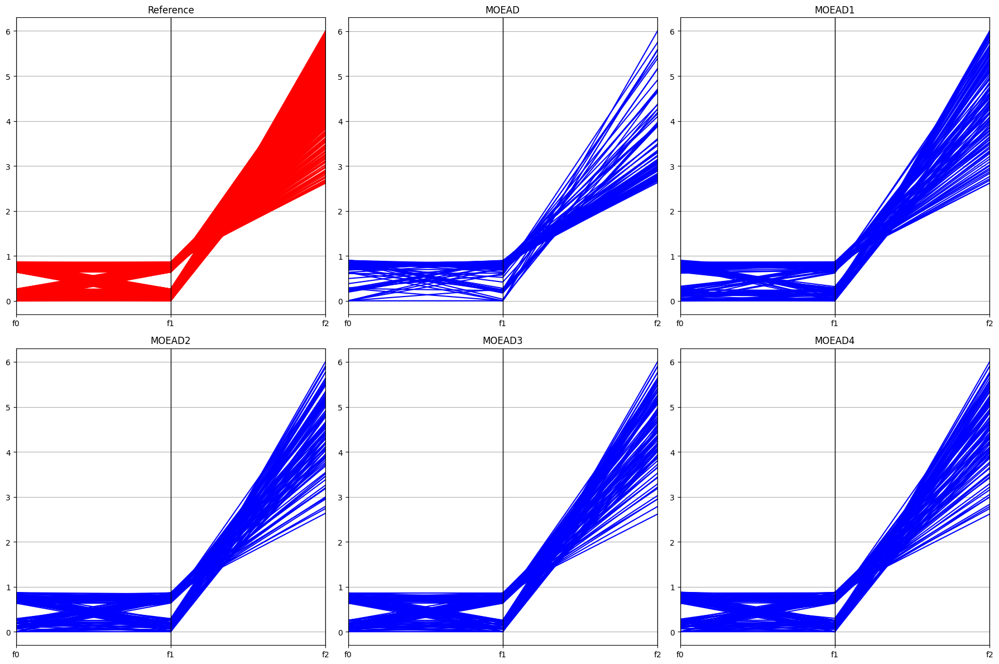

In [10]:
front = FrontND(fronts_path, references_path, metric, dimensions=3)
boxplot = Boxplot(experiment_data, metrics, metric)

for instance in front.instances:
    boxplot.show_instance(instance)
    front.show(instance, median=True)
    print("\n"*6)